<a href="https://colab.research.google.com/github/drewwint/Dartbrains_code/blob/main/2_intro_neuroimaging_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
localizer_path = '/content/gdrive/MyDrive/localizer-data'

#dl.clone(source='https://gin.g-node.org/ljchang/Localizer', path=localizer_path)


In [3]:
! pip install pybids
from bids import BIDSLayout, BIDSValidator
import os

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 14.9 MB 4.3 MB/s 
     |████████████████████████████████| 68 kB 6.5 MB/s 
     |████████████████████████████████| 125 kB 73.7 MB/s 
     |████████████████████████████████| 96 kB 6.1 MB/s 
     |████████████████████████████████| 1.3 MB 55.7 MB/s 
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13723 sha256=06454a77275f6945b099164e7daca20573773a1c3146f49f220bbd4098e0e9e6
  Stored in directory: /root/.cache/pip/wheels/72/b0/3f/1d95f96ff986c7dfffe46ce2be4062f38ebd04b506c77c81b9
Successfully built docopt
  Attempting uninstall: sqlalchemy
    Found existing installation: SQLAlchemy 1.4.40
    Uninstalling SQLAlchemy-1.4.40:
      Successfully uninstalled SQLAlchemy-1.4.40
  Attempting uninstall: click
    Found existing installation: click 7.1.2
    Uninstalling click-7.1.2:
      Successfully uninstalled click-7.1.2
ERROR: pi

##The BIDSLayout

Pybids is a package to help query and navigate a neuroimaging dataset that is in the BIDs format. At the core of pybids is the BIDSLayout object. A BIDSLayout is a lightweight Python class that represents a BIDS project file tree and provides a variety of helpful methods for querying and manipulating BIDS files. While the BIDSLayout initializer has a large number of arguments you can use to control the way files are indexed and accessed, you will most commonly initialize a BIDSLayout by passing in the BIDS dataset root location as a single argument.

Notice we are setting derivatives=True. This means the layout will also index the derivatives sub folder, which might contain preprocessed data, analyses, or other user generated files.

In [4]:
layout = BIDSLayout(localizer_path, derivatives=True)
layout

/usr/local/lib/python3.7/dist-packages/bids/layout/validation.py:156: UserWarning: The PipelineDescription field was superseded by GeneratedBy in BIDS 1.4.0. You can use ``pybids upgrade`` to update your derivative dataset.
  warnings.warn("The PipelineDescription field was superseded "


BIDS Layout: .../gdrive/MyDrive/localizer-data | Subjects: 94 | Sessions: 0 | Runs: 0

When we initialize a BIDSLayout, all of the files and metadata found under the specified root folder are indexed. This can take a few seconds (or, for very large datasets, a minute or two). Once initialization is complete, we can start querying the BIDSLayout in various ways. The main query method is .get(). If we call .get() with no additional arguments, we get back a list of all the BIDS files in our dataset.

Let’s return the first 10 files

In [5]:
layout.get()[:10]

[<BIDSJSONFile filename='/content/gdrive/MyDrive/localizer-data/dataset_description.json'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/.DS_Store'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/.DS_Store'>,
 <BIDSJSONFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/dataset_description.json'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/logs/CITATION.bib'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/logs/CITATION.html'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/logs/CITATION.md'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/logs/CITATION.tex'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/sub-S01.html'>,
 <BIDSFile filename='/content/gdrive/MyDrive/localizer-data/derivatives/fmriprep/sub-S01/.DS_Store'>]

As you can see, just a generic .get() call gives us all of the files. We will definitely want to be a bit more specific. We can specify the type of data we would like to query. For example, suppose we want to return the first 10 subject ids.

### Getting first 10 Ids

In [6]:
layout.get(target='subject', return_type='id', scope='derivatives')[:10]

['S55', 'S53', 'S67', 'S09', 'S51', 'S54', 'S83', 'S35', 'S34', 'S37']

## Or we can get the file names for the raw bold functional nifti images for the first 10 subjects. 

In [7]:
layout.get(target='subject', scope='raw', suffix='bold', return_type='file')[:10]

['/content/gdrive/MyDrive/localizer-data/sub-S01/func/sub-S01_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S02/func/sub-S02_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S03/func/sub-S03_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S04/func/sub-S04_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S05/func/sub-S05_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S06/func/sub-S06_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S07/func/sub-S07_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S08/func/sub-S08_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S09/func/sub-S09_task-localizer_bold.nii.gz',
 '/content/gdrive/MyDrive/localizer-data/sub-S10/func/sub-S10_task-localizer_bold.nii.gz']

When you call .get() on a BIDSLayout, the default returned values are objects of class BIDSFile. A BIDSFile is a lightweight container for individual files in a BIDS dataset.

Here are some of the attributes and methods available to us in a BIDSFile (note that some of these are only available for certain subclasses of BIDSFile; e.g., you can’t call get_image() on a BIDSFile that doesn’t correspond to an image file!):

* path: The full path of the associated file

* filename: The associated file’s filename (without directory)

* dirname: The directory containing the file

* get_entities(): Returns information about entities associated with this BIDSFile (optionally including metadata)

* get_image(): Returns the file contents as a nibabel image (only works for image files)

* get_df(): Get file contents as a pandas DataFrame (only works for TSV files)

* get_metadata(): Returns a dictionary of all metadata found in associated JSON files

* get_associations(): Returns a list of all files associated with this one in some way

Let’s explore the first file in a little more detail.

In [8]:
f = layout.get()[0]
f

<BIDSJSONFile filename='/content/gdrive/MyDrive/localizer-data/dataset_description.json'>

If we wanted to get the path of the file, we can use .path

In [9]:
f.path

'/content/gdrive/MyDrive/localizer-data/dataset_description.json'

Suppose we were interested in getting a list of tasks included in the dataset.

In [10]:
layout.get_task()

['localizer']

We can query all of the files associated with this task.

In [11]:
layout.get(task='localizer', suffix='bold', scope='raw')[:10]

[<BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S01/func/sub-S01_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S02/func/sub-S02_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S03/func/sub-S03_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S04/func/sub-S04_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S05/func/sub-S05_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S06/func/sub-S06_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S07/func/sub-S07_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S08/func/sub-S08_task-localizer_bold.nii.gz'>,
 <BIDSImageFile filename='/content/gdrive/MyDrive/localizer-data/sub-S09

Notice that there are nifti and event files. We can get the filename for the first particant’s functional run

In [12]:
f = layout.get(task='localizer')[0].filename
f

'sub-S01_task-localizer_desc-carpetplot_bold.svg'

If you want a summary of all the files in your BIDSLayout, but don’t want to have to iterate BIDSFile objects and extract their entities, you can get a nice bird’s-eye view of your dataset using the to_df() method.

In [13]:
layout.to_df()

entity,path,datatype,extension,subject,suffix,task
0,/content/gdrive/MyDrive/localizer-data/dataset...,NaN,.json,NaN,description,NaN
1,/content/gdrive/MyDrive/localizer-data/derivat...,NaN,.DS_Store,NaN,,NaN
2,/content/gdrive/MyDrive/localizer-data/partici...,NaN,.json,NaN,participants,NaN
3,/content/gdrive/MyDrive/localizer-data/partici...,NaN,.tsv,NaN,participants,NaN
4,/content/gdrive/MyDrive/localizer-data/phenoty...,NaN,.tsv,NaN,behavioural,NaN
...,...,...,...,...,...,...
3396,/content/gdrive/MyDrive/localizer-data/derivat...,NaN,NaN,NaN,NaN,NaN
3397,/content/gdrive/MyDrive/localizer-data/derivat...,NaN,NaN,NaN,NaN,NaN
3398,/content/gdrive/MyDrive/localizer-data/derivat...,NaN,NaN,NaN,NaN,NaN
3399,/content/gdrive/MyDrive/localizer-data/derivat...,NaN,NaN,NaN,NaN,NaN


# Loading Data with Nibabel

Neuroimaging data is often stored in the format of nifti files .nii which can also be compressed using gzip .nii.gz. These files store both 3D and 4D data and also contain structured metadata in the image header.

There is an very nice tool to access nifti data stored on your file system in python called nibabel. If you don’t already have nibabel installed on your computer it is easy via pip. First, tell the jupyter cell that you would like to access the unix system outside of the notebook and then install nibabel using pip !pip install nibabel. You only need to run this once (unless you would like to update the version).

nibabel objects can be initialized by simply pointing to a nifti file even if it is compressed through gzip. First, we will import the nibabel module as nib (short and sweet so that we don’t have to type so much when using the tool). I’m also including a path to where the data file is located so that I don’t have to constantly type this. It is easy to change this on your own computer.

We will be loading an anatomical image from subject S01 from the localizer dataset. See this paper for more information about this dataset.

We will use pybids to grab subject S01’s T1 image.

In [14]:
import nibabel as nib

data = nib.load(layout.get(subject='S01', scope='derivatives', suffix='T1w', return_type='file', extension='nii.gz')[1])

If we want to get more help on how to work with the nibabel data object we can either consult the documentation or add a ?.

In [15]:
#data?

The imaging data is stored in either a 3D or 4D numpy array. Just like numpy, it is easy to get the dimensions of the data using shape.

In [16]:
data.shape

(193, 229, 193)

Looks like there are 3 dimensions (x,y,z) that is the number of voxels in each dimension. If we know the voxel size, we could convert this into millimeters.

We can also directly access the data and plot a single slice using standard matplotlib functions.

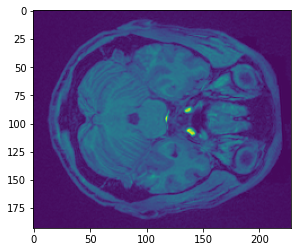

In [17]:
%matplotlib inline

import matplotlib.pyplot as plt

plt.imshow(data.get_fdata()[:,:,50])

Try slicing different dimensions (x,y,z) yourself to get a feel for how the data is represented in this anatomical image.


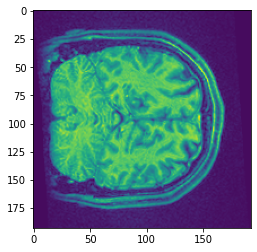

In [18]:
plt.imshow(data.get_fdata()[:,70,:])

We can also access data from the image header. Let’s assign the header of an image to a variable and print it to view it’s contents.

In [19]:
header = data.header
print(header)   

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 193 229 193   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [1. 1. 1. 1. 0. 0. 0. 0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 2
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'xform matrices modified by FixHeaderApplyTransforms (niworkflows v1.1.12).'
aux_file        : b''
qform_code      : mni
sform_code      : mni
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : -96.0
qoffset_y       : -132.0
qoffs

Some of the important information in the header is information about the orientation of the image in space. This can be represented as the affine matrix, which can be used to transform images between different spaces.

In [20]:
data.affine

array([[   1.,    0.,    0.,  -96.],
       [   0.,    1.,    0., -132.],
       [   0.,    0.,    1.,  -78.],
       [   0.,    0.,    0.,    1.]])

# Plotting Data with Nilearn

There are many useful tools from the nilearn library to help manipulate and visualize neuroimaging data. See their documentation for an example.

In this section, we will explore a few of their different plotting functions, which can work directly with nibabel instances.

In [21]:
! pip install nilearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.6 MB 5.0 MB/s 


In [22]:
%matplotlib inline

from nilearn.plotting import view_img, plot_glass_brain, plot_anat, plot_epi

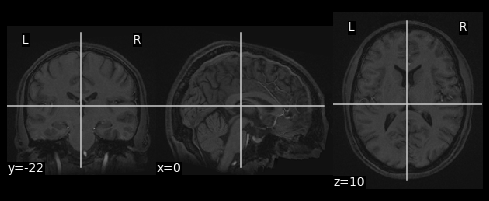

In [23]:
plot_anat(data)

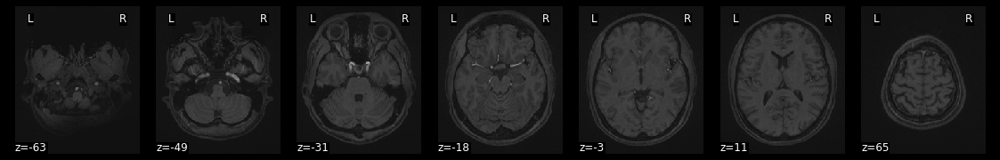

In [24]:
plot_anat(data, draw_cross=False, display_mode='z')

nilearn also has a neat interactive viewer called view_img for examining images directly in the notebook.

/usr/local/lib/python3.7/dist-packages/nilearn/plotting/html_stat_map.py:219: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  bg_img = load_mni152_template()
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



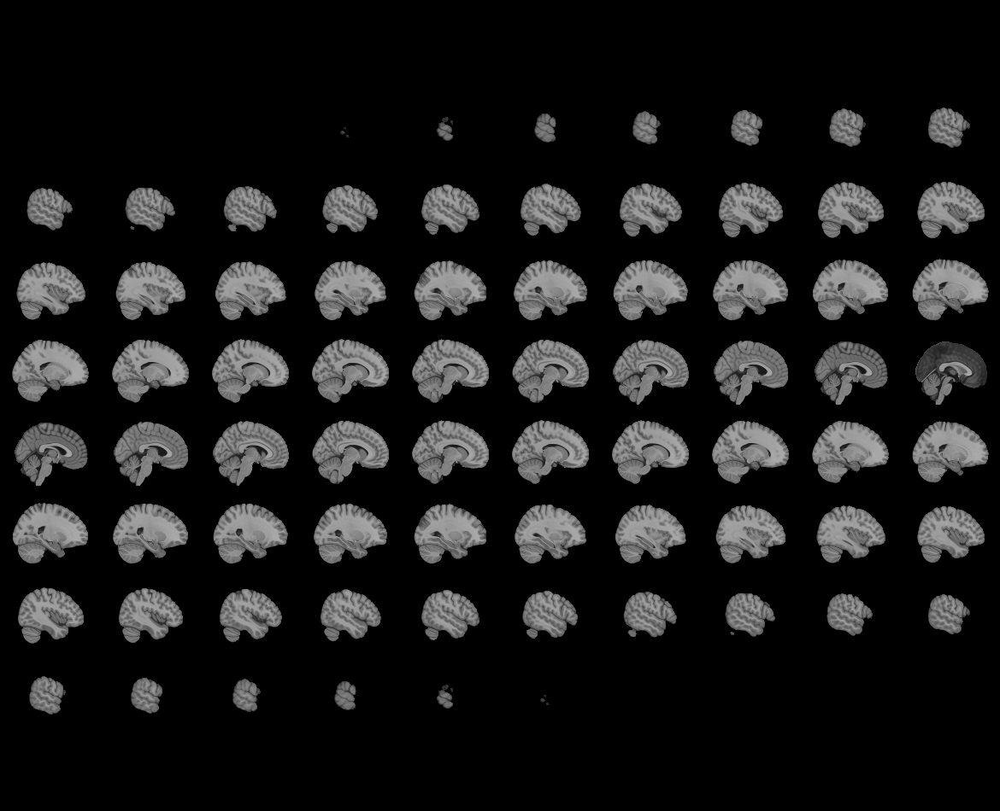
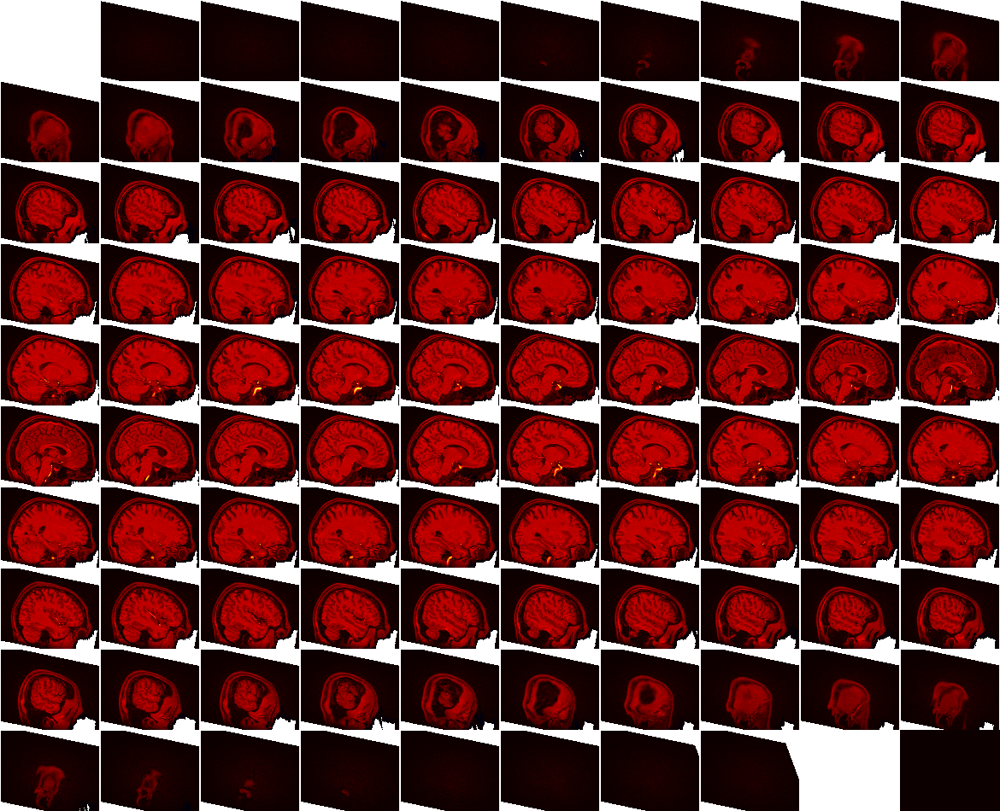

In [25]:
view_img(data)

The view_img function is particularly useful for overlaying statistical maps over an anatomical image so that we can interactively examine where the results are located.

As an example, **let’s load a mask of the amygdala** and try to find where it is located. We will download it from Neurovault using a function from nltools.

In [26]:
! pip install nltools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.3 MB 4.8 MB/s 


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/usr/local/lib/python3.7/dist-packages/nilearn/image/resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



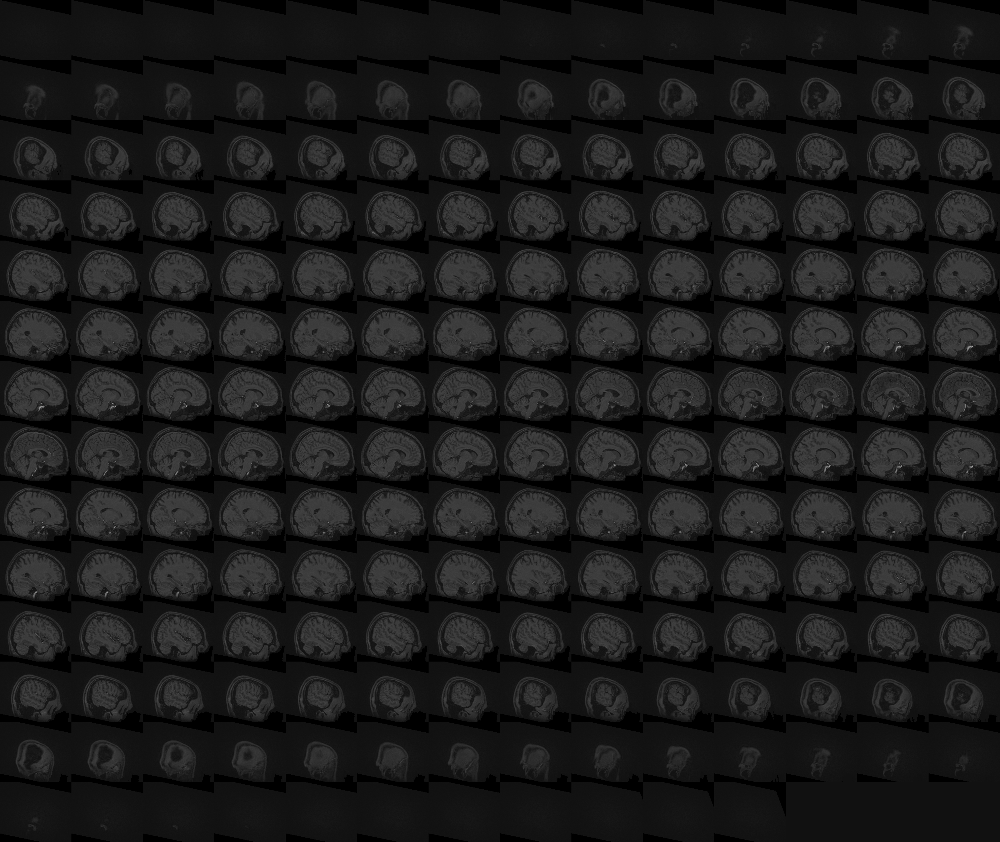
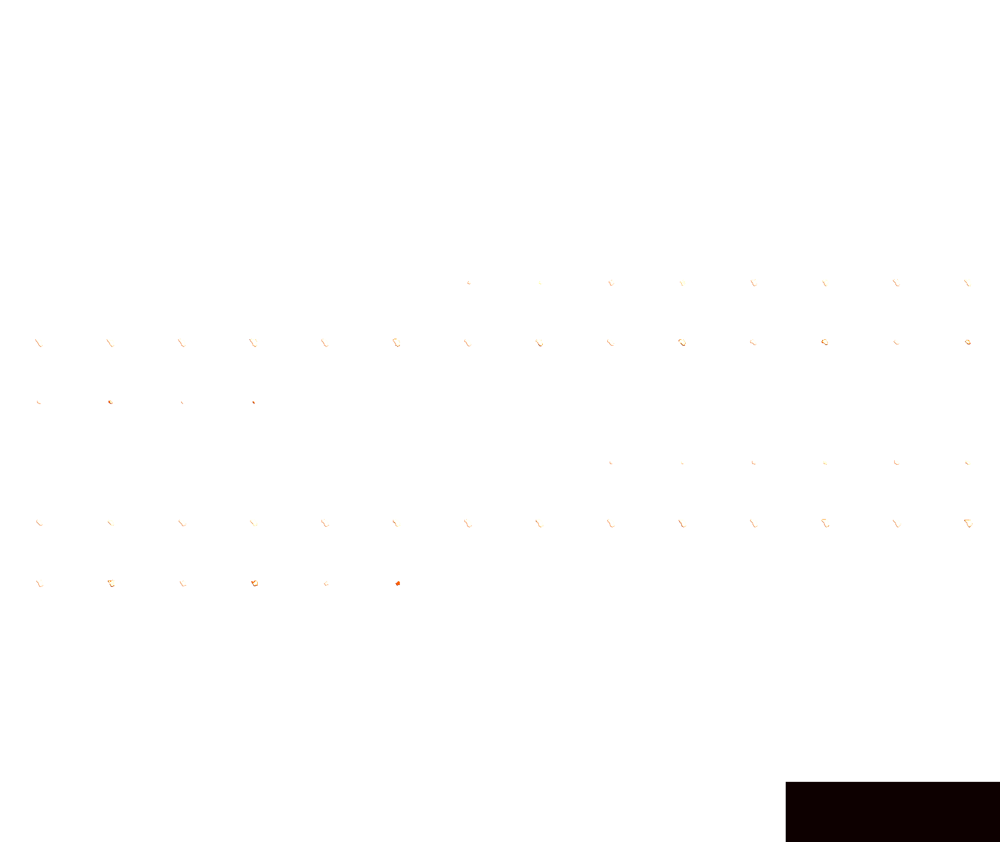

In [27]:
from nltools.data import Brain_Data
amygdala_mask = Brain_Data('https://neurovault.org/media/images/1290/FSL_BAmyg_thr0.nii.gz').to_nifti()

view_img(amygdala_mask, data)

We can also plot a glass brain which allows us to see through the brain from different slice orientations. In this example, we will plot the binary amygdala mask.

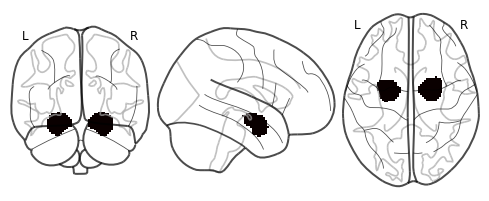

In [28]:
plot_glass_brain(amygdala_mask)

# Manipulating Data with Nltools

Ok, we’ve now learned how to use nibabel to load imaging data and nilearn to plot it.

Next we are going to learn how to use the nltools package that tries to make loading, plotting, and manipulating data easier. It uses many functions from nibabel, nilearn, and other python libraries. The bulk of the nltools toolbox is built around the Brain_Data() class. The concept behind the class is to have a similar feel to a pandas dataframe, which means that it should feel intuitive to manipulate the data.

The Brain_Data() class has several attributes that may be helpful to know about. First, it stores imaging data in .data as a vectorized features by observations matrix. Each image is an observation and each voxel is a feature. Space is flattened using nifti_masker from nilearn. This object is also stored as an attribute in .nifti_masker to allow transformations from 2D to 3D/4D matrices. In addition, a brain_mask is stored in .mask. Finally, there are attributes to store either class labels for prediction/classification analyses in .Y and design matrices in .X. These are both expected to be pandas DataFrames.

We will give a quick overview of basic Brain_Data operations, but we encourage you to see our documentation for more details.

### Brain_Data basics

To get a feel for Brain_Data, let’s load an example anatomical overlay image that comes packaged with the toolbox.

In [29]:
from nltools.data import Brain_Data
from nltools.utils import get_anatomical

anat = Brain_Data(get_anatomical())
anat

nltools.data.brain_data.Brain_Data(data=(238955,), Y=0, X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz)

To view the attributes of Brain_Data use the vars() function.

In [30]:
print(vars(anat))

{'mask': <nibabel.nifti1.Nifti1Image object at 0x7fcdb5e0c210>, 'nifti_masker': NiftiMasker(mask_img=<nibabel.nifti1.Nifti1Image object at 0x7fcdb5e0c210>), 'data': array([1875., 2127., 2182., ..., 5170., 5180., 2836.], dtype=float32), 'Y': Empty DataFrame
Columns: []
Index: [], 'X': Empty DataFrame
Columns: []
Index: []}


Brain_Data has many methods to help manipulate, plot, and analyze imaging data. We can use the dir() function to get a quick list of all of the available methods that can be used on this class.

To learn more about how to use these tools either use the ? function, or look up the function in the api documentation.

In [31]:
print(dir(anat))

['X', 'Y', '__add__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__module__', '__mul__', '__ne__', '__new__', '__radd__', '__reduce__', '__reduce_ex__', '__repr__', '__rmul__', '__rsub__', '__setattr__', '__setitem__', '__sizeof__', '__str__', '__sub__', '__subclasshook__', '__truediv__', '__weakref__', 'aggregate', 'align', 'append', 'apply_mask', 'astype', 'bootstrap', 'copy', 'data', 'decompose', 'detrend', 'distance', 'dtype', 'empty', 'extract_roi', 'filter', 'find_spikes', 'groupby', 'icc', 'iplot', 'isempty', 'mask', 'mean', 'median', 'multivariate_similarity', 'nifti_masker', 'plot', 'predict', 'predict_multi', 'r_to_z', 'randomise', 'regions', 'regress', 'scale', 'shape', 'similarity', 'smooth', 'standardize', 'std', 'sum', 'temporal_resample', 'threshold', 'to_nifti', 'transform_pairwise', 't

Ok, now let’s load a single subject’s functional data from the localizer dataset. We will load one that has already been preprocessed with fmriprep and is stored in the derivatives folder.

Loading data can be a little bit slow especially if the data need to be resampled to the template, which is set at 
$2mm^3$ by default. However, once it’s loaded into the workspace it should be relatively fast to work with it.


In [36]:
!sudo apt update

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:4 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease [1,581 B]
Get:6 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:9 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [91.1 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages [912 kB]
Get:13 http://archive.ubuntu.com/ubuntu bionic-backports In

In [37]:
!sudo add-apt-repository ppa:git-core/ppa # this is how you get the latest version of git on Unbutu : https://itsfoss.com/install-git-ubuntu/
!sudo apt install git # reinstalling git to get the latest version

 The most current stable version of Git for Ubuntu.

For release candidates, go to https://launchpad.net/~git-core/+archive/candidate .
 More info: https://launchpad.net/~git-core/+archive/ubuntu/ppa
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Hit:1 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:10 http://archive.ubuntu.com/ubunt

In [38]:
# configuring git
!git config --global user.email "drewwinters4@gmail.com"
!git config --global user.name "Drew Winters"

In [39]:
!git --version # checking the version 

git version 2.37.2


In [40]:
!wget -O- http://neuro.debian.net/lists/bionic.us-nh.full | tee /etc/apt/sources.list.d/neurodebian.sources.list \
 && export GNUPGHOME="$(mktemp -d)" \
 && echo "disable-ipv6" >> ${GNUPGHOME}/dirmngr.conf \
 && (apt-key adv --homedir $GNUPGHOME --recv-keys --keyserver hkp://pgpkeys.eu 0xA5D32F012649A5A9 \
|| { curl -sSL http://neuro.debian.net/_static/neuro.debian.net.asc | apt-key add -; } ) \
 && apt-get update \
 && apt-get install git-annex-standalone git

--2022-08-25 11:46:28--  http://neuro.debian.net/lists/bionic.us-nh.full
Resolving neuro.debian.net (neuro.debian.net)... 129.170.233.11
Connecting to neuro.debian.net (neuro.debian.net)|129.170.233.11|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 262
Saving to: ‘STDOUT’

-                   100%[===================>]     262  --.-KB/s    in 0s      

deb http://neuro.debian.net/debian data main contrib non-free
#deb-src http://neuro.debian.net/debian data main contrib non-free
deb http://neuro.debian.net/debian bionic main contrib non-free
#deb-src http://neuro.debian.net/debian bionic main contrib non-free
2022-08-25 11:46:28 (24.7 MB/s) - written to stdout [262/262]

Executing: /tmp/apt-key-gpghome.r7hqmZU9CW/gpg.1.sh --homedir /tmp/tmp.i9sqSDfaPP --recv-keys --keyserver hkp://pgpkeys.eu 0xA5D32F012649A5A9
gpg: key A5D32F012649A5A9: public key "NeuroDebian Archive Key <pkg-exppsy-maintainers@lists.alioth.debian.org>" imported
gpg: Total number processed: 1

In [41]:
!pip install datalad

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.5 MB 5.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.4 MB 10.4 MB/s 
     |████████████████████████████████| 77 kB 6.7 MB/s 
     |████████████████████████████████| 130 kB 58.4 MB/s 
     |████████████████████████████████| 468 kB 56.5 MB/s 
     |████████████████████████████████| 126 kB 36.4 MB/s 
     |████████████████████████████████| 48 kB 3.8 MB/s 
     |████████████████████████████████| 4.1 MB 55.1 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
  Created wheel for datalad: filename=datalad-0.17.3-py3-none-any.whl size=1410765 sha256=2deff4e36a325181706f37eddbc5b79f018236fd5fb26abfdd178ac9ca895634
  Stored in directory: /root/.cache/pip/wheels/71

In [42]:
import os
import glob
import datalad.api as dl
import pandas as pd

In [43]:
localizer_path = '/content/gdrive/MyDrive/localizer-data'

dl.clone(source='https://gin.g-node.org/ljchang/Localizer', path=localizer_path)


Dataset('/content/gdrive/MyDrive/localizer-data')

In [44]:
ds = dl.Dataset(localizer_path)

In [45]:
result = ds.get(os.path.join(localizer_path, 'sub-S01'))
result = ds.get(glob.glob(os.path.join(localizer_path, '*.json')))
result = ds.get(glob.glob(os.path.join(localizer_path, '*.tsv')))
result = ds.get(glob.glob(os.path.join(localizer_path, 'phenotype')))

INFO:datalad.ui.dialog:Clear progress bars
INFO:datalad.ui.dialog:Refresh progress bars


action summary:
  get (notneeded: 3)


In [73]:
sub = 'S01'

data = Brain_Data(os.path.join(localizer_path,"derivatives","fmriprep", f'sub-{sub}','func', f'sub-{sub}_task-localizer_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz'))

Here are a few quick basic data operations.

Find number of images in Brain_Data() instance

In [74]:
print(len(data))

128


Find the dimensions of the data (images x voxels)

In [75]:
print(data.shape())

(128, 238955)


We can use any type of indexing to slice the data such as integers, lists of integers, slices, or boolean vectors.

In [76]:
import numpy as np

print(data[5].shape())

print(data[[1,6,2]].shape())

print(data[0:10].shape())

index = np.zeros(len(data), dtype=bool)
index[[1,5,9, 16, 20, 22]] = True

print(data[index].shape())

(238955,)
(3, 238955)
(10, 238955)
(6, 238955)


## Simple Arithmetic Operations

Calculate the mean for every voxel over images

In [77]:
data.mean()

nltools.data.brain_data.Brain_Data(data=(238955,), Y=0, X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz)

Calculate the standard deviation for every voxel over images

In [78]:
data.std()

nltools.data.brain_data.Brain_Data(data=(238955,), Y=0, X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz)

Methods can be chained. Here we get the shape of the mean.

In [79]:
print(data.mean().shape())

(238955,)


Brain_Data instances can be added and subtracted

In [80]:
new = data[1]+data[2]
new

nltools.data.brain_data.Brain_Data(data=(238955,), Y=0, X=(0, 0), mask=MNI152_T1_2mm_brain_mask.nii.gz)

Brain_Data instances can be manipulated with basic arithmetic operations.

Here we add 10 to every voxel and scale by 2

In [81]:
data2 = (data + 10) * 2

Brain_Data instances can be copied

In [82]:
new = data.copy()

Brain_Data instances can be easily converted to nibabel instances, which store the data in a 3D/4D matrix. This is useful for interfacing with other python toolboxes such as nilearn

In [83]:
data.to_nifti()

Brain_Data instances can be concatenated using the append method

In [84]:
new = new.append(data[4])

Lists of Brain_Data instances can also be concatenated by recasting as a Brain_Data object.

In [85]:
print(type([x for x in data[:4]]))

type(Brain_Data([x for x in data[:4]]))

<class 'list'>


nltools.data.brain_data.Brain_Data

In [86]:
import nltools.data
nltools.data.brain_data.Brain_Data

nltools.data.brain_data.Brain_Data

Any Brain_Data object can be written out to a nifti file.

In [87]:
data.write('Tmp_Data.nii.gz')

Images within a Brain_Data() instance are iterable. Here we use a list comprehension to calculate the overall mean across all voxels within an image.

In [88]:
[x.mean() for x in data]

[3632.536,
 3639.0662,
 3636.0562,
 3631.1252,
 3627.1565,
 3631.0986,
 3648.3137,
 3657.7656,
 3654.2615,
 3658.1348,
 3652.4163,
 3647.3025,
 3648.4019,
 3651.63,
 3648.55,
 3648.7566,
 3654.2322,
 3655.227,
 3650.0222,
 3644.6763,
 3645.765,
 3645.0671,
 3633.773,
 3635.367,
 3634.0962,
 3637.7722,
 3636.5322,
 3643.0576,
 3643.034,
 3635.3635,
 3644.4868,
 3659.792,
 3650.5303,
 3642.4023,
 3644.5435,
 3638.261,
 3638.7898,
 3645.6985,
 3641.1465,
 3632.2185,
 3624.994,
 3628.2786,
 3626.063,
 3623.819,
 3636.2058,
 3628.5884,
 3629.2664,
 3622.4158,
 3617.2485,
 3609.94,
 3620.9905,
 3626.5645,
 3631.9675,
 3629.276,
 3631.3801,
 3625.395,
 3621.5083,
 3620.3164,
 3625.705,
 3626.373,
 3623.368,
 3630.5776,
 3630.8086,
 3626.8877,
 3622.8083,
 3618.6865,
 3617.2358,
 3615.7021,
 3618.1902,
 3622.9312,
 3618.4065,
 3611.3342,
 3613.9846,
 3630.378,
 3630.0913,
 3622.9004,
 3613.8503,
 3614.9832,
 3622.9844,
 3622.4487,
 3619.9285,
 3612.1162,
 3614.8423,
 3608.7314,
 3614.767,
 360

Though, we could also do this with the mean method by setting axis=1.

In [89]:
data.mean(axis=1)

array([3632.536 , 3639.0662, 3636.0562, 3631.1252, 3627.1565, 3631.0986,
       3648.3137, 3657.7656, 3654.2615, 3658.1348, 3652.4163, 3647.3025,
       3648.4019, 3651.63  , 3648.55  , 3648.7566, 3654.2322, 3655.227 ,
       3650.0222, 3644.6763, 3645.765 , 3645.0671, 3633.773 , 3635.367 ,
       3634.0962, 3637.7722, 3636.5322, 3643.0576, 3643.034 , 3635.3635,
       3644.4868, 3659.792 , 3650.5303, 3642.4023, 3644.5435, 3638.261 ,
       3638.7898, 3645.6985, 3641.1465, 3632.2185, 3624.994 , 3628.2786,
       3626.063 , 3623.819 , 3636.2058, 3628.5884, 3629.2664, 3622.4158,
       3617.2485, 3609.94  , 3620.9905, 3626.5645, 3631.9675, 3629.276 ,
       3631.3801, 3625.395 , 3621.5083, 3620.3164, 3625.705 , 3626.373 ,
       3623.368 , 3630.5776, 3630.8086, 3626.8877, 3622.8083, 3618.6865,
       3617.2358, 3615.7021, 3618.1902, 3622.9312, 3618.4065, 3611.3342,
       3613.9846, 3630.378 , 3630.0913, 3622.9004, 3613.8503, 3614.9832,
       3622.9844, 3622.4487, 3619.9285, 3612.1162, 

Let’s plot the mean to see how the global signal changes over time.

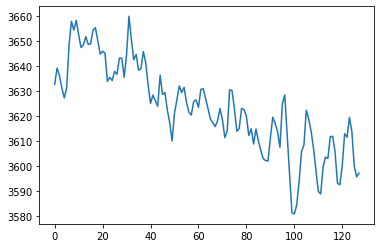

In [90]:
plt.plot(data.mean(axis=1))

## Plotting

There are multiple ways to plot your data.

For a very quick plot, you can return a montage of axial slices with the .plot() method. As an example, we will plot the mean of each voxel over time.

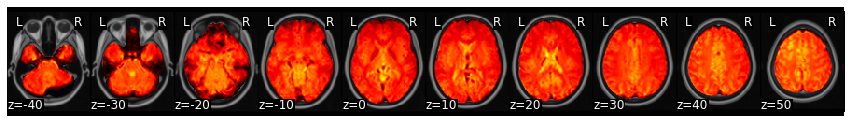

In [91]:
f = data.mean().plot()

There is an interactive .iplot() method based on nilearn view_img.

In [71]:
data.mean().iplot()

interactive(children=(FloatText(value=0.0, description='Threshold'), HTML(value='Image is 3D', description='Vo…

Brain_Data() instances can be converted to a nibabel instance and plotted using any nilearn plot method such as glass brain.

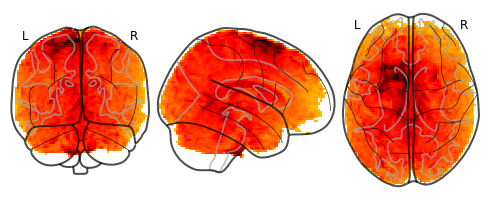

In [92]:
plot_glass_brain(data.mean().to_nifti())

Ok, that’s the basics. Brain_Data can do much more!

Check out some of our [tutorials](https://nltools.org/auto_examples/index.html) for more detailed examples.

We’ll be using this tool throughout the course.